In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [3]:
(cifar10_train_images, cifar10_train_labels), (cifar10_valid_images, cifar10_valid_labels) = tf.keras.datasets.cifar10.load_data()

In [4]:
NOISE_DEGREE = 0.3
ENCODING_DIMS = 128

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

def ds_permutation_to_noise_vae(image, label):
    print("image:", image)
    image = tf.cast(image, tf.float32)
    image = image / tf.reduce_max(image)
    white_noise = tf.random.uniform(tf.shape(image))
    noised_image = tf.clip_by_value(white_noise * NOISE_DEGREE + image, clip_value_min=0, clip_value_max=1)
    return noised_image, image

train_ds = tf.data.Dataset.zip((tf.data.Dataset.from_tensor_slices(cifar10_train_images), tf.data.Dataset.from_tensor_slices(cifar10_train_labels)))
valid_ds = tf.data.Dataset.zip((tf.data.Dataset.from_tensor_slices(cifar10_valid_images), tf.data.Dataset.from_tensor_slices(cifar10_valid_labels)))

for idx, (img, label) in zip(range(3), train_ds):
    plt.subplot(1, 3, idx+1)
    plt.title(class_names[label])
    plt.imshow(img)

image: Tensor("args_0:0", shape=(32, 32, 3), dtype=uint8)
image: Tensor("args_0:0", shape=(32, 32, 3), dtype=uint8)


In [ ]:
train_vae = train_ds.shuffle(10000).map(ds_permutation_to_noise_vae).batch(16)
valid_vae = valid_ds.shuffle(10000).map(ds_permutation_to_noise_vae).batch(1)

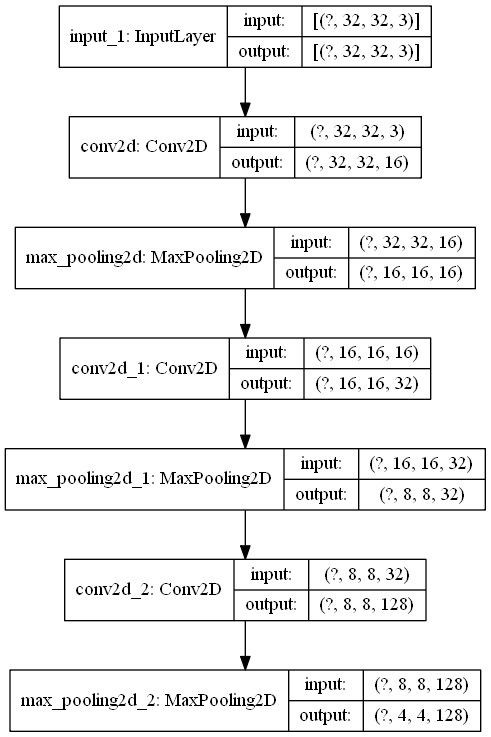

In [5]:
conv_encoder = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(32,32,3)),
    tf.keras.layers.Conv2D(16, strides=1, kernel_size=3, padding="same", activation="selu"),
    tf.keras.layers.MaxPool2D(pool_size = 2),
    tf.keras.layers.Conv2D(32, strides=1, kernel_size=3, padding="same", activation="selu"),
    tf.keras.layers.MaxPool2D(pool_size = 2),
    tf.keras.layers.Conv2D(ENCODING_DIMS, strides=1, kernel_size=3, padding="same", activation="selu"),
    tf.keras.layers.MaxPool2D(pool_size = 2),
])

tf.keras.utils.plot_model(conv_encoder, show_shapes = True)

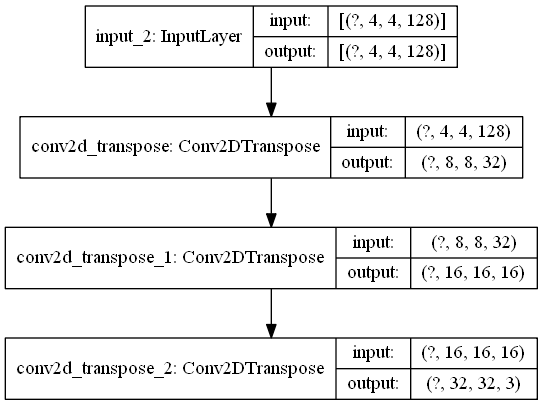

In [6]:
conv_decoder = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(4,4,ENCODING_DIMS)),
    tf.keras.layers.Conv2DTranspose(32, strides=2, kernel_size=3, padding="same", activation="selu"),
    tf.keras.layers.Conv2DTranspose(16, strides=2, kernel_size=3, padding="same", activation="selu"),
    tf.keras.layers.Conv2DTranspose(3, strides=2, kernel_size=3, padding="same", activation="sigmoid"),
])

tf.keras.utils.plot_model(conv_decoder, show_shapes = True)

In [7]:
autoencoder = tf.keras.models.Sequential([conv_encoder, conv_decoder])
# tf.keras.utils.plot_model(autoencoder, show_shapes=True, expand_nested=True)
# autoencoder.summary()
autoencoder.compile(loss="mse", optimizer="adam")

(10, 32, 32, 3)


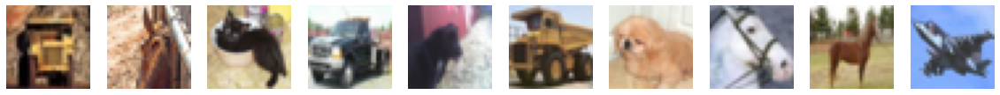

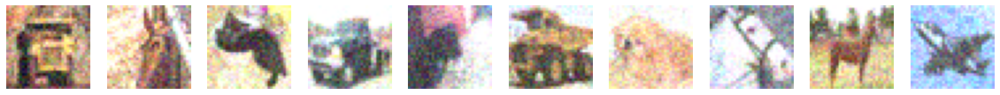

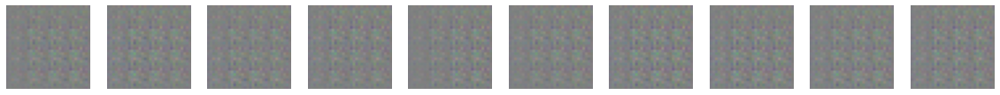

In [8]:
def display_images_row(images):
    columns = images.shape[0]
    for idx in range(columns):
        image = images[idx]
        plt.subplot(1, columns, idx + 1)
        plt.axis(False)
        plt.imshow(image)
        
def display_denoising_images():
    sample_arr = []
    src_images, gtruth_images = next(iter(valid_vae.batch(10)))
    src_images = tf.squeeze(src_images, axis=1)
    gtruth_images = tf.squeeze(gtruth_images, axis=1)
    predicted_images = autoencoder.predict(src_images)
    print(predicted_images.shape)
    plt.figure(figsize=(20, 4))
    display_images_row(gtruth_images)
    plt.show()
    plt.figure(figsize=(20, 4))
    display_images_row(src_images)
    plt.show()
    plt.figure(figsize=(20, 4))
    display_images_row(predicted_images)
    plt.show()

display_denoising_images()


(10, 32, 32, 3)


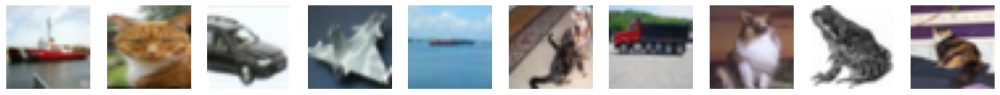

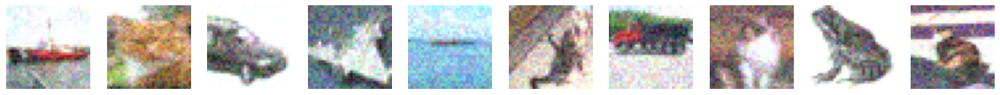

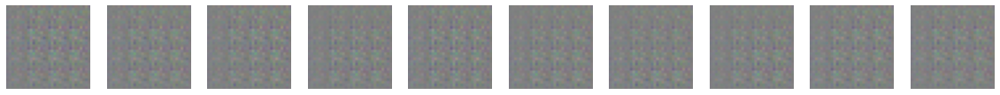

Epoch 1/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0101(10, 32, 32, 3)


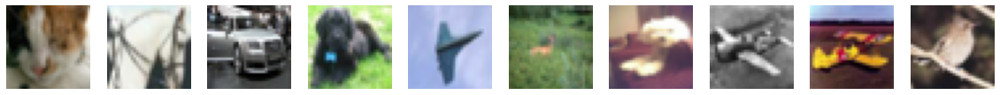

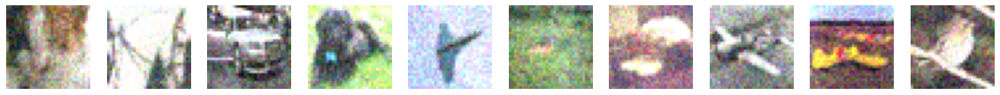

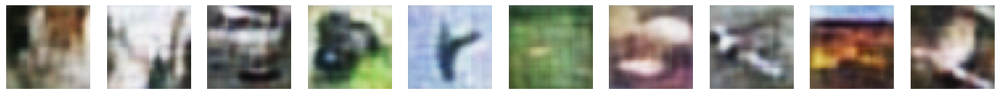

3125/3125 [==============================] - 76s 24ms/step - loss: 0.0101 - val_loss: 0.0071
Epoch 2/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0066(10, 32, 32, 3)


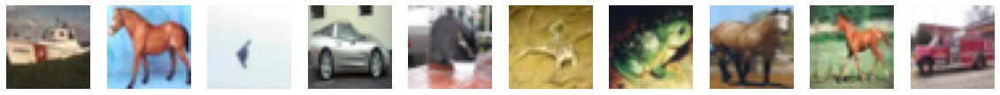

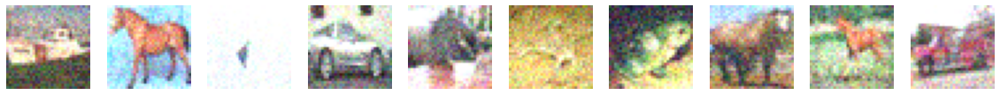

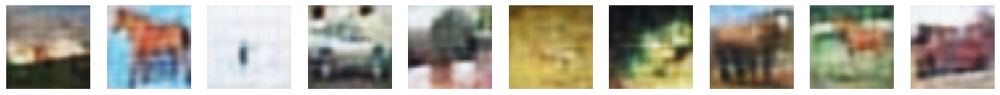

3125/3125 [==============================] - 79s 25ms/step - loss: 0.0066 - val_loss: 0.0061
Epoch 3/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0060(10, 32, 32, 3)


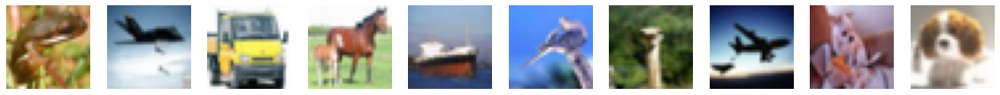

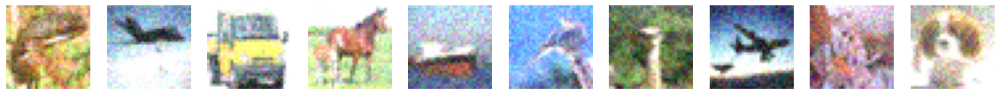

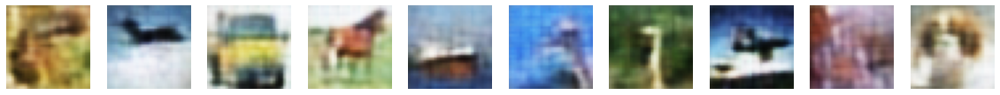

3125/3125 [==============================] - 91s 29ms/step - loss: 0.0060 - val_loss: 0.0058
Epoch 4/20
3125/3125 [==============================] - ETA: 0s - loss: 0.0056(10, 32, 32, 3)


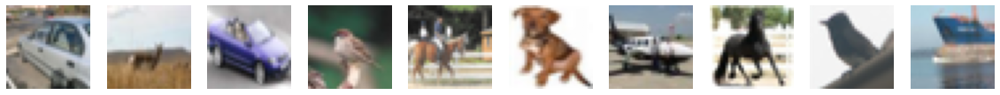

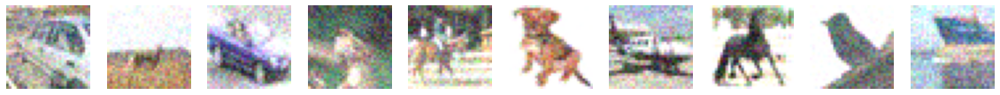

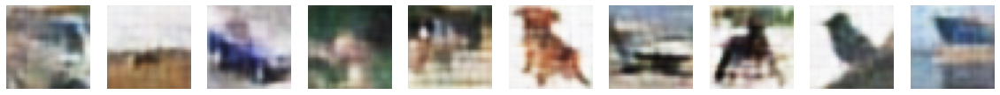

3125/3125 [==============================] - 85s 27ms/step - loss: 0.0056 - val_loss: 0.0055
Epoch 5/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0054(10, 32, 32, 3)


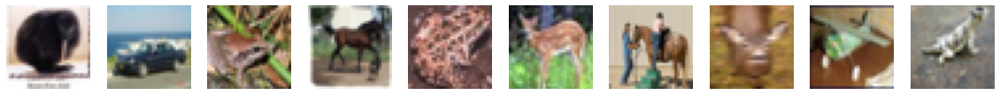

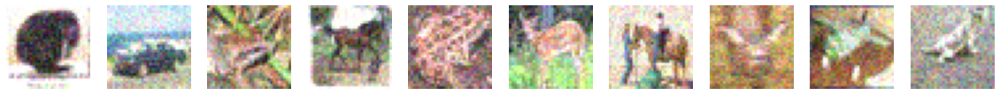

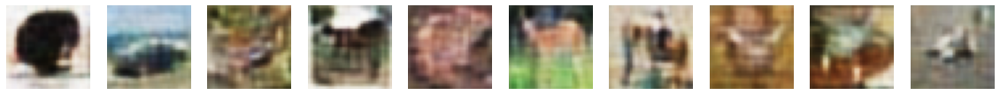

3125/3125 [==============================] - 88s 28ms/step - loss: 0.0054 - val_loss: 0.0053
Epoch 6/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0052(10, 32, 32, 3)


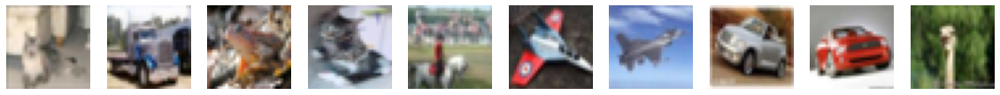

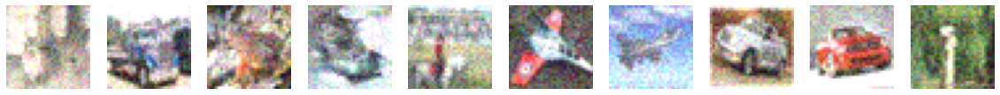

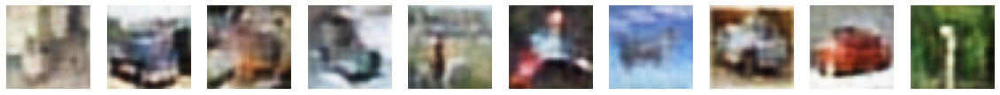

3125/3125 [==============================] - 84s 27ms/step - loss: 0.0052 - val_loss: 0.0052
Epoch 7/20
3125/3125 [==============================] - ETA: 0s - loss: 0.0051(10, 32, 32, 3)


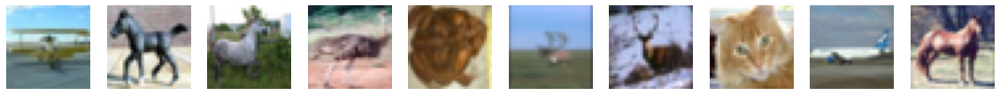

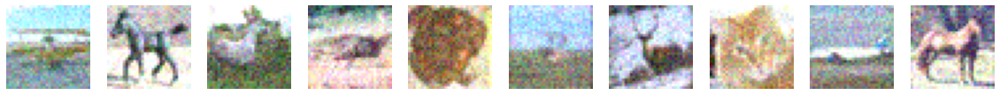

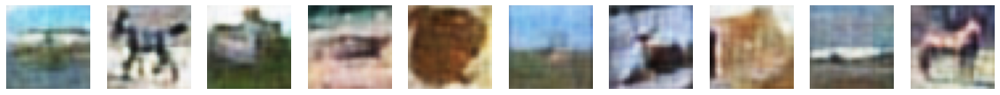

3125/3125 [==============================] - 91s 29ms/step - loss: 0.0051 - val_loss: 0.0051
Epoch 8/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0050- ET (10, 32, 32, 3)


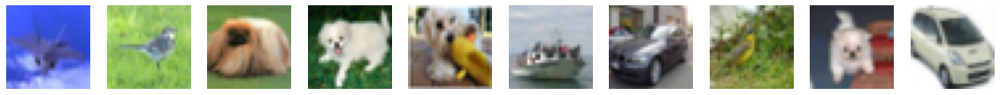

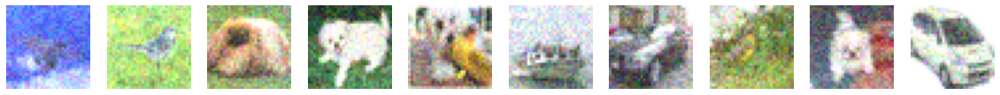

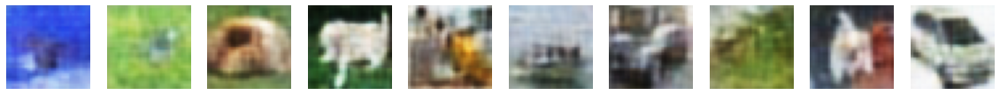

3125/3125 [==============================] - 87s 28ms/step - loss: 0.0050 - val_loss: 0.0050
Epoch 9/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0050(10, 32, 32, 3)


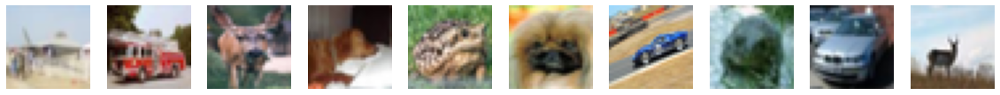

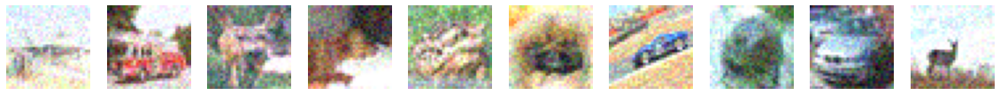

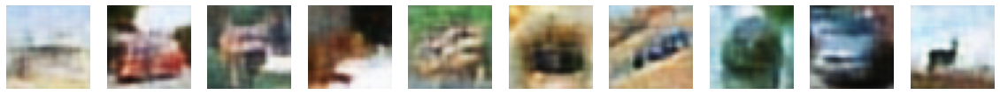

3125/3125 [==============================] - 86s 28ms/step - loss: 0.0050 - val_loss: 0.0049
Epoch 10/20
3123/3125 [============================>.] - ETA: 0s - loss: 0.0049(10, 32, 32, 3)


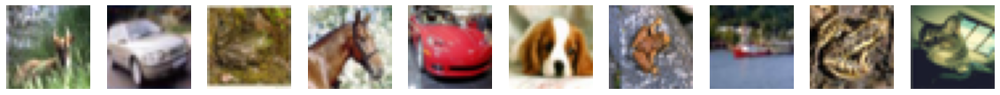

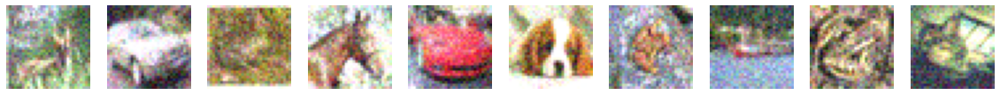

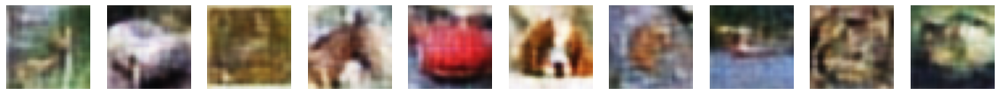

3125/3125 [==============================] - 89s 28ms/step - loss: 0.0049 - val_loss: 0.0049
Epoch 11/20
3125/3125 [==============================] - ETA: 0s - loss: 0.0048(10, 32, 32, 3)


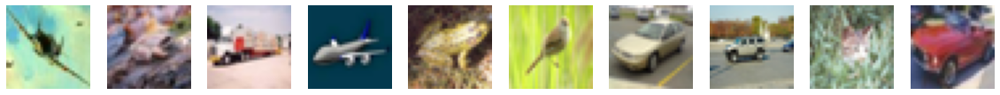

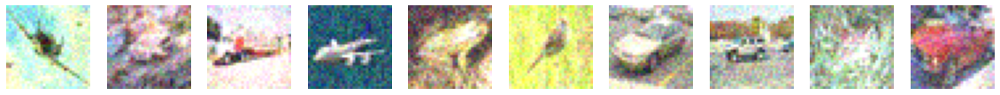

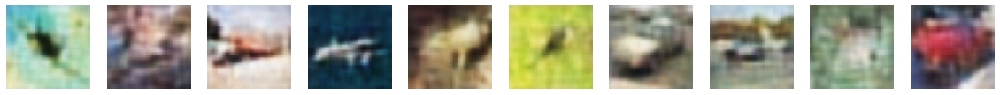

3125/3125 [==============================] - 89s 28ms/step - loss: 0.0048 - val_loss: 0.0049
Epoch 12/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0048(10, 32, 32, 3)


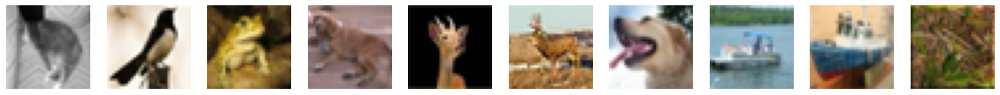

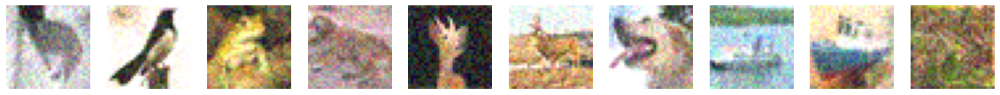

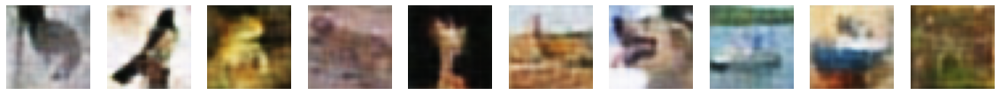

3125/3125 [==============================] - 92s 29ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 13/20
3125/3125 [==============================] - ETA: 0s - loss: 0.0047(10, 32, 32, 3)


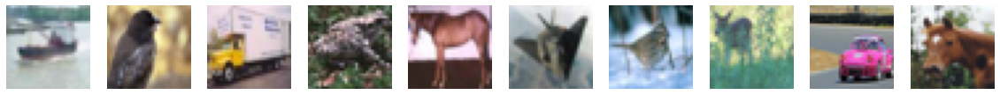

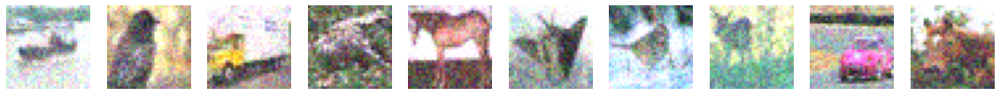

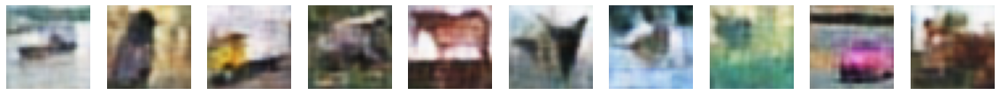

3125/3125 [==============================] - 87s 28ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 14/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0047(10, 32, 32, 3)


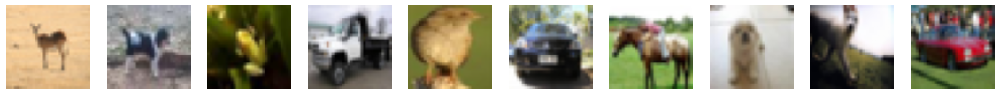

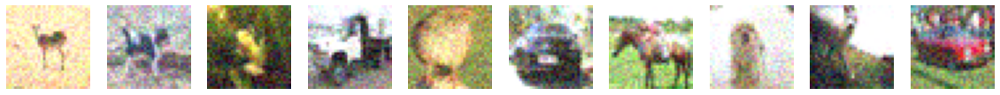

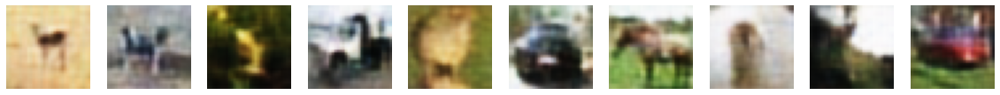

3125/3125 [==============================] - 86s 28ms/step - loss: 0.0047 - val_loss: 0.0046
Epoch 15/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0047(10, 32, 32, 3)


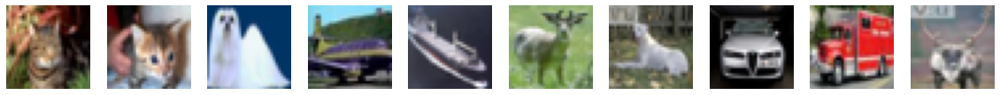

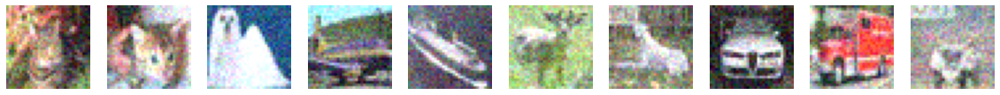

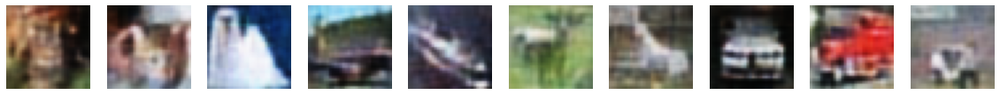

3125/3125 [==============================] - 85s 27ms/step - loss: 0.0047 - val_loss: 0.0046
Epoch 16/20
3123/3125 [============================>.] - ETA: 0s - loss: 0.0046(10, 32, 32, 3)


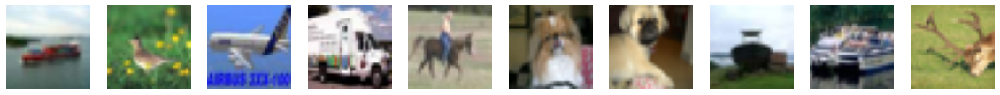

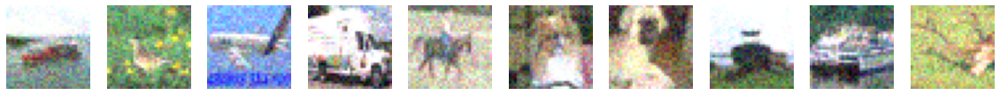

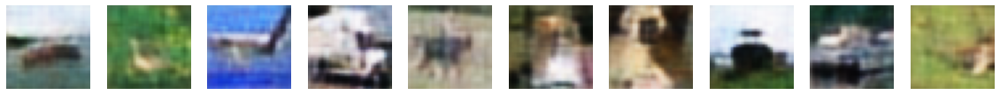

3125/3125 [==============================] - 90s 29ms/step - loss: 0.0046 - val_loss: 0.0046
Epoch 17/20
3124/3125 [============================>.] - ETA: 0s - loss: 0.0046(10, 32, 32, 3)


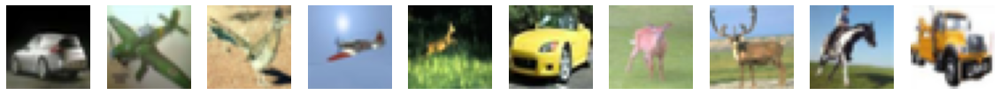

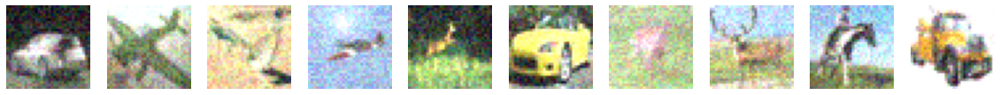

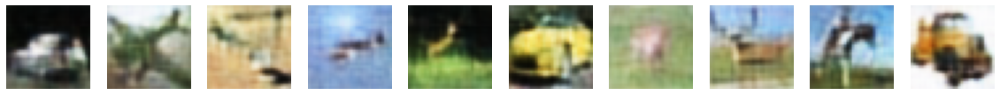

3125/3125 [==============================] - 88s 28ms/step - loss: 0.0046 - val_loss: 0.0046
Epoch 18/20
3123/3125 [============================>.] - ETA: 0s - loss: 0.0046(10, 32, 32, 3)


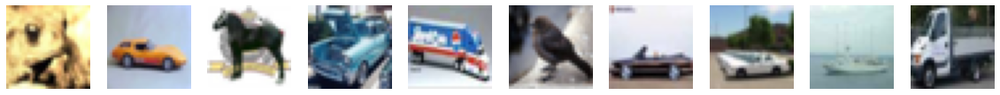

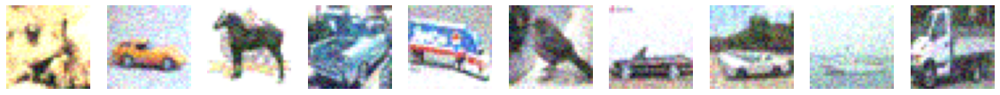

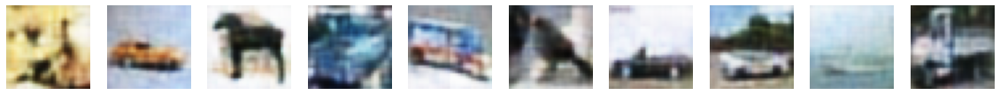

3125/3125 [==============================] - 86s 28ms/step - loss: 0.0046 - val_loss: 0.0046
Epoch 19/20
3123/3125 [============================>.] - ETA: 0s - loss: 0.0046(10, 32, 32, 3)


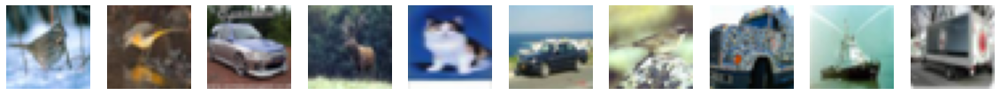

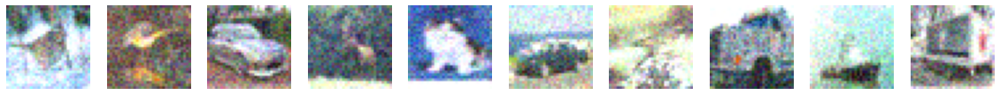

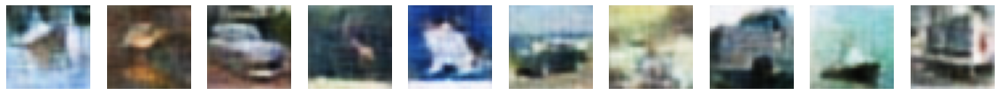

3125/3125 [==============================] - 81s 26ms/step - loss: 0.0046 - val_loss: 0.0046
Epoch 20/20
3123/3125 [============================>.] - ETA: 0s - loss: 0.0045(10, 32, 32, 3)


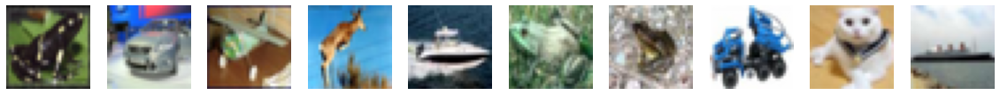

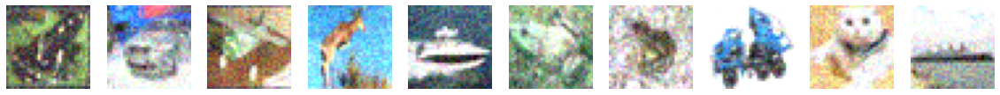

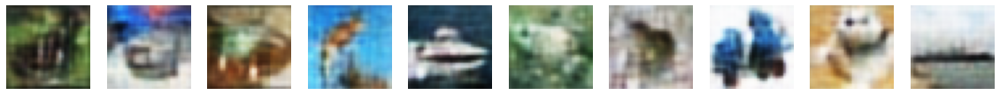

3125/3125 [==============================] - 89s 28ms/step - loss: 0.0045 - val_loss: 0.0045


In [9]:
class CustomCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        display_denoising_images()
    def on_train_begin(self, epoch, logs=None):
        display_denoising_images()

EPOCHS=20
history = autoencoder.fit(train_vae, epochs=EPOCHS, validation_data=(valid_vae), callbacks=[CustomCallback()])

<AxesSubplot:>

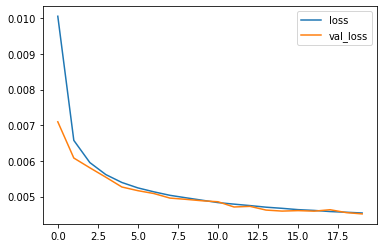

In [10]:
pd.DataFrame(history.history).plot()

In [16]:
def from_prebuild_to_regular_ds(image, label):
    image = tf.cast(image, tf.float32)
    image = image / tf.reduce_max(image)
    return image, label[0]

clf_train_ds = train_ds.take(500).map(from_prebuild_to_regular_ds).batch(16)
clf_valid_ds = valid_ds.map(from_prebuild_to_regular_ds).batch(16)

---- pretrain network with weights()

In [17]:
conv_encoder_clone_1 = tf.keras.models.clone_model(conv_encoder)
conv_encoder_clone_1.set_weights(conv_encoder.get_weights())

clf_part_1 = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(4,4,ENCODING_DIMS)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(32, activation="selu"),
    tf.keras.layers.Dense(10, activation="softmax"),
])


clf_model_w_pretrain = tf.keras.models.Sequential([conv_encoder_clone_1, clf_part_1])
clf_model_w_pretrain.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

In [18]:
class CustomCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if(epoch == EPOCHS):
            conv_encoder_clone_1.trainable = True
            print()
            print("make conv_encoder trainable")

conv_encoder_clone_1.trainable = False

history_pretrained = clf_model_w_pretrain.fit(clf_train_ds, epochs=EPOCHS * 2, validation_data=(clf_valid_ds), callbacks=[CustomCallback()])
# pd.DataFrame(history_pretrained.history).plot()

Epoch 1/40
32/32 [==============================] - 3s 95ms/step - loss: 2.3621 - accuracy: 0.2180 - val_loss: 2.0519 - val_accuracy: 0.3000
Epoch 2/40
32/32 [==============================] - 3s 103ms/step - loss: 1.4548 - accuracy: 0.4980 - val_loss: 1.9717 - val_accuracy: 0.3399
Epoch 3/40
32/32 [==============================] - 3s 91ms/step - loss: 1.0705 - accuracy: 0.6260 - val_loss: 1.9596 - val_accuracy: 0.3600
Epoch 4/40
32/32 [==============================] - 3s 92ms/step - loss: 0.7873 - accuracy: 0.7740 - val_loss: 2.1363 - val_accuracy: 0.3570
Epoch 5/40
32/32 [==============================] - 3s 95ms/step - loss: 0.5796 - accuracy: 0.8340 - val_loss: 2.3039 - val_accuracy: 0.3445
Epoch 6/40
32/32 [==============================] - 3s 98ms/step - loss: 0.4244 - accuracy: 0.9020 - val_loss: 2.4106 - val_accuracy: 0.3504
Epoch 7/40
32/32 [==============================] - 3s 95ms/step - loss: 0.2787 - accuracy: 0.9380 - val_loss: 2.3323 - val_accuracy: 0.3603
Epoch 8/40
3

<AxesSubplot:>

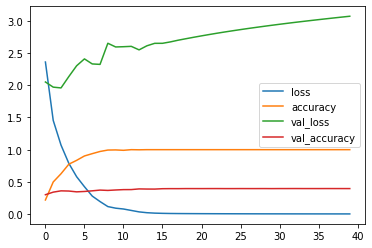

In [23]:
pd.DataFrame(history_pretrained.history).plot()
# plt.ylim(0,0.25)

---- pretrain network W/O weights()

In [20]:
conv_encoder_clone_2 = tf.keras.models.clone_model(conv_encoder)
clf_part_2 = tf.keras.models.clone_model(clf_part_1)

clf_model_wo_pretrain = tf.keras.models.Sequential([conv_encoder_clone_2, clf_part_2])
clf_model_wo_pretrain.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

In [21]:
history_not_pretrained = clf_model_wo_pretrain.fit(clf_train_ds, epochs=EPOCHS, validation_data=(clf_valid_ds), callbacks=[CustomCallback()])

Epoch 1/20
32/32 [==============================] - 4s 123ms/step - loss: 2.2257 - accuracy: 0.1860 - val_loss: 1.9906 - val_accuracy: 0.3087
Epoch 2/20
32/32 [==============================] - 4s 127ms/step - loss: 1.7205 - accuracy: 0.3920 - val_loss: 1.8578 - val_accuracy: 0.3377
Epoch 3/20
32/32 [==============================] - 4s 120ms/step - loss: 1.4836 - accuracy: 0.4760 - val_loss: 1.8836 - val_accuracy: 0.3463
Epoch 4/20
32/32 [==============================] - 4s 121ms/step - loss: 1.2814 - accuracy: 0.5600 - val_loss: 2.0898 - val_accuracy: 0.3290
Epoch 5/20
32/32 [==============================] - 4s 119ms/step - loss: 1.1434 - accuracy: 0.6420 - val_loss: 1.9913 - val_accuracy: 0.3602
Epoch 6/20
32/32 [==============================] - 4s 121ms/step - loss: 0.9220 - accuracy: 0.7260 - val_loss: 1.9676 - val_accuracy: 0.3715
Epoch 7/20
32/32 [==============================] - 4s 127ms/step - loss: 0.7532 - accuracy: 0.7580 - val_loss: 2.0788 - val_accuracy: 0.3691
Epoch 

<AxesSubplot:>

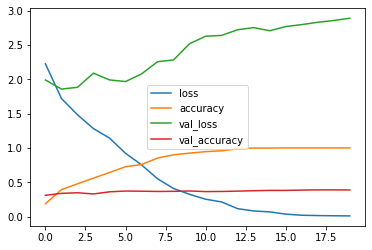

In [24]:
pd.DataFrame(history_not_pretrained.history).plot()
# plt.ylim(0,2)

In [67]:
def __interpolate(image, alphas):
    base = tf.zeros_like(image)
    image = tf.expand_dims(image, axis=0)
    base = tf.expand_dims(base, axis=0)
    alphas = alphas[:, tf.newaxis]    
    return base + alphas * image

interpolations = __interpolate(np.array([10., 100., 1000., 1000.]), np.linspace(start=0, stop=1, num=3))
print(interpolations)

print(tf.reduce_mean(interpolations, axis=[1]))

tf.Tensor(
[[   0.    0.    0.    0.]
 [   5.   50.  500.  500.]
 [  10.  100. 1000. 1000.]], shape=(3, 4), dtype=float64)
tf.Tensor([  0.   263.75 527.5 ], shape=(3,), dtype=float64)
